In [1]:
import warnings
warnings.filterwarnings('ignore') 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from PIL import Image
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import torch.optim as optim
import torch.nn.functional as F
import colorama
from colorama import Fore, Style



In [2]:
import opendatasets as od


In [3]:
od.download("https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset") #json file for kaggle token uploaded

Skipping, found downloaded files in "./new-plant-diseases-dataset" (use force=True to force download)


In [4]:
import os

In [5]:
data_dir = './new-plant-diseases-dataset'

In [6]:
os.listdir(data_dir)

['New Plant Diseases Dataset(Augmented)',
 'test',
 'new plant diseases dataset(augmented)']

In [7]:
Root_dir = "new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)"
train_dir = Root_dir + "/train"
valid_dir = Root_dir + "/valid"
test_dir = "new-plant-diseases-dataset/test"
Diseases_classes = os.listdir(train_dir)

In [8]:
Diseases_classes

['Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Tomato___Tomato_mosaic_virus',
 'Apple___Cedar_apple_rust',
 'Corn_(maize)___healthy',
 'Potato___Late_blight',
 'Strawberry___healthy',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Grape___Black_rot',
 'Cherry_(including_sour)___healthy',
 'Peach___Bacterial_spot',
 'Tomato___healthy',
 'Tomato___Late_blight',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Soybean___healthy',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Potato___Early_blight',
 'Strawberry___Leaf_scorch',
 'Grape___Esca_(Black_Measles)',
 'Grape___healthy',
 'Apple___Black_rot',
 'Pepper,_bell___healthy',
 'Peach___healthy',
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 'Tomato___Septoria_leaf_spot',
 'Squash___Powdery_mildew',
 'Tomato___Leaf_Mold',
 'Blueberry___healthy',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Apple___Apple_scab',
 'Tomato___Target_Spot',
 'Raspberry___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Corn_(maize)___Common_rust_',
 'Po

In [9]:
print(Fore.GREEN +str(Diseases_classes))
print("\nTotal number of classes are: ", len(Diseases_classes))

['Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Tomato___Tomato_mosaic_virus', 'Apple___Cedar_apple_rust', 'Corn_(maize)___healthy', 'Potato___Late_blight', 'Strawberry___healthy', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Grape___Black_rot', 'Cherry_(including_sour)___healthy', 'Peach___Bacterial_spot', 'Tomato___healthy', 'Tomato___Late_blight', 'Orange___Haunglongbing_(Citrus_greening)', 'Soybean___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Potato___Early_blight', 'Strawberry___Leaf_scorch', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Apple___Black_rot', 'Pepper,_bell___healthy', 'Peach___healthy', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Septoria_leaf_spot', 'Squash___Powdery_mildew', 'Tomato___Leaf_Mold', 'Blueberry___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Apple___Apple_scab', 'Tomato___Target_Spot', 'Raspberry___healthy', 'Pepper,_bell___Bacterial_spot', 'Corn_(maize)___Common_rust_', 'Potato___healthy', 'Tomato___Early_

In [10]:
plt.figure(figsize=(60,60), dpi=200)
cnt = 0
plant_names = []
tot_images = 0

for i in Diseases_classes:
    cnt += 1
    plant_names.append(i)
    plt.subplot(7,7,cnt)
    
    image_path = os.listdir(train_dir + "/" + i)
    print(Fore.GREEN)
    print("The Number of Images in " +i+ ":", len(image_path), end= " ")
    tot_images += len(image_path)
    
    img_show = plt.imread(train_dir + "/" + i + "/" + image_path[0])
    
    plt.imshow(img_show)
    plt.xlabel(i,fontsize=30)
    plt.xticks([])
    plt.yticks([])
    
    
print("\nTotal Number of Images in Directory: ", tot_images)


The Number of Images in Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 1642 
The Number of Images in Tomato___Tomato_mosaic_virus: 1790 
The Number of Images in Apple___Cedar_apple_rust: 1760 
The Number of Images in Corn_(maize)___healthy: 1859 
The Number of Images in Potato___Late_blight: 1939 
The Number of Images in Strawberry___healthy: 1824 
The Number of Images in Tomato___Spider_mites Two-spotted_spider_mite: 1741 
The Number of Images in Grape___Black_rot: 1888 
The Number of Images in Cherry_(including_sour)___healthy: 1826 
The Number of Images in Peach___Bacterial_spot: 1838 
The Number of Images in Tomato___healthy: 1926 
The Number of Images in Tomato___Late_blight: 1851 
The Number of Images in Orange___Haunglongbing_(Citrus_greening): 2010 
The Number of Images in Soybean___healthy: 2022 
The Number of Images in Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 1722 
The Number of Images in Potato___Early_blight: 1939 
The Number of Images in Strawberry___Leaf_scorch: 

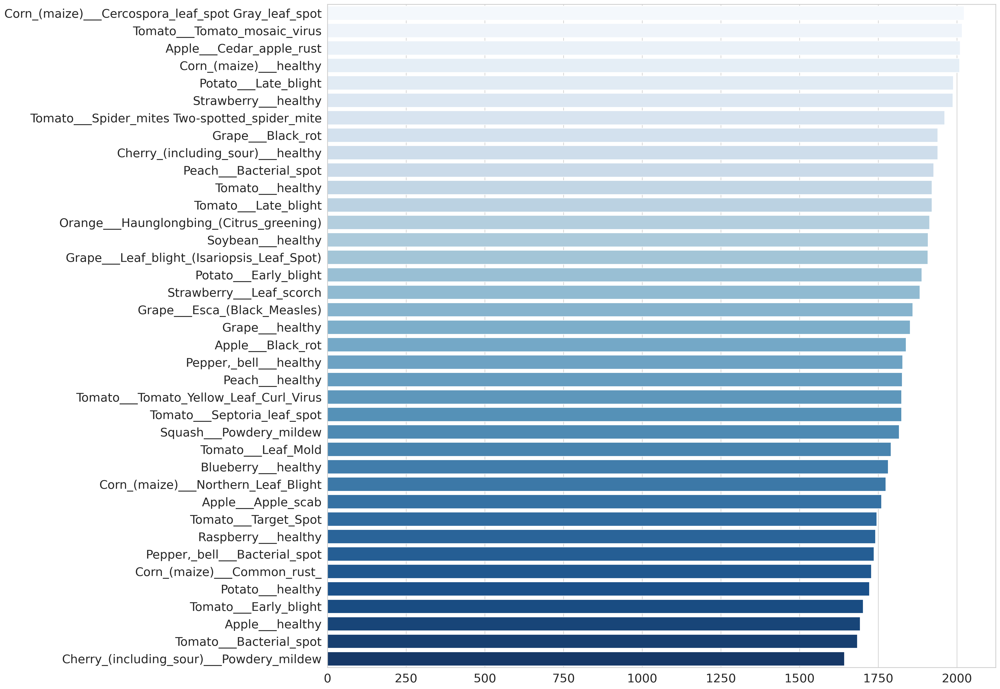

In [11]:
plant_names = []
Len = []
for i in Diseases_classes:
    plant_names.append(i)
    imgs_path = os.listdir(train_dir + "/" + i)
    Len.append(len(imgs_path))

Len.sort(reverse=True)

sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(20,20),dpi=200)
ax = sns.barplot(x= Len, y= plant_names, palette="Blues")
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [14]:
train = ImageFolder(train_dir, transform=transforms.ToTensor())
valid = ImageFolder(valid_dir, transform=transforms.ToTensor()) 

In [15]:
train

Dataset ImageFolder
    Number of datapoints: 70295
    Root location: new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train
    StandardTransform
Transform: ToTensor()

In [16]:
train[1]

(tensor([[[0.5294, 0.5098, 0.4941,  ..., 0.4745, 0.4745, 0.4784],
          [0.5137, 0.5098, 0.5098,  ..., 0.4745, 0.4745, 0.4784],
          [0.5020, 0.5137, 0.5255,  ..., 0.4745, 0.4784, 0.4824],
          ...,
          [0.1961, 0.1961, 0.1922,  ..., 0.3412, 0.3490, 0.3529],
          [0.1804, 0.1804, 0.1804,  ..., 0.3412, 0.3451, 0.3490],
          [0.1686, 0.1686, 0.1647,  ..., 0.3412, 0.3451, 0.3451]],
 
         [[0.5020, 0.4824, 0.4667,  ..., 0.4549, 0.4549, 0.4588],
          [0.4863, 0.4824, 0.4824,  ..., 0.4549, 0.4549, 0.4588],
          [0.4745, 0.4863, 0.4980,  ..., 0.4549, 0.4588, 0.4627],
          ...,
          [0.1333, 0.1333, 0.1294,  ..., 0.3098, 0.3176, 0.3216],
          [0.1216, 0.1216, 0.1216,  ..., 0.3137, 0.3176, 0.3216],
          [0.1098, 0.1098, 0.1059,  ..., 0.3137, 0.3176, 0.3176]],
 
         [[0.7020, 0.6824, 0.6667,  ..., 0.6745, 0.6745, 0.6784],
          [0.6863, 0.6824, 0.6824,  ..., 0.6745, 0.6745, 0.6784],
          [0.6745, 0.6863, 0.6980,  ...,

In [17]:
img, label = train[0]
print(img.shape, label)

torch.Size([3, 256, 256]) 0



Label :Apple___Apple_scab(0)

Label :Apple___Black_rot(1)

Label :Apple___Cedar_apple_rust(2)

Label :Blueberry___healthy(4)

Label :Cherry_(including_sour)___healthy(6)

Label :Corn_(maize)___Common_rust_(8)

Label :Tomato___Septoria_leaf_spot(32)

Label :Tomato___healthy(37)


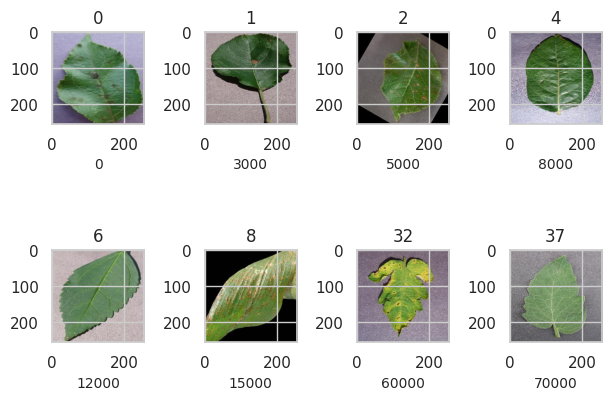

In [18]:
def show_image(image, label):
    print("Label :" + train.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))
    
    
image_list = [0, 3000, 5000, 8000, 12000, 15000, 60000, 70000]
    
chs = 0
for img in image_list:
    chs += 1
    plt.subplot(2,4,chs)
    print(Fore.GREEN)
    plt.tight_layout()
    plt.xlabel(img,fontsize=10)
    plt.title(train[img][1])
    show_image(*train[img])

In [19]:
batch_size = 8 #Since I have have small space allocated on my GPU, this is the maximum size 

In [20]:
# DataLoaders for training and validation
train_dataloader = DataLoader(train, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
valid_dataloader = DataLoader(valid, batch_size=batch_size, num_workers=2, pin_memory=True)

In [21]:
# for moving data into GPU (if available)
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available:
        return torch.device("cuda")
    else:
        return torch.device("cpu")

In [22]:
device = get_default_device() #very important for faster processing speed
#get_default_device()

In [23]:
# for moving data to device (CPU or GPU)
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

In [24]:
#to_device() - pushing certain model on GPU in this case 

In [25]:
# for loading in the device (GPU if available else CPU)
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dataloader, device):
        self.dataloader = dataloader
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dataloader:
            yield to_device(b, self.device)
        
    def __len__(self):
        """Number of batches"""
        return len(self.dataloader)

In [26]:
# Moving data into GPU, WrappedDataLoader
train_dataloader = DeviceDataLoader(train_dataloader, device)
valid_dataloader = DeviceDataLoader(valid_dataloader, device)

In [27]:
# for calculating the accuracy
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [28]:
class ImageClassificationBase(nn.Module):
    
    def training_step(self, batch):
        images, labels = batch 
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))

In [29]:
# convolution block with BatchNormalization
def ConvBlock(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
             nn.BatchNorm2d(out_channels),
             nn.ReLU(inplace=True)]
    if pool:
        layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)

In [30]:
# resnet architecture 
class CNN_NeuralNet(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()
        
        self.conv1 = ConvBlock(in_channels, 64)
        self.conv2 = ConvBlock(64, 128, pool=True) 
        self.res1 = nn.Sequential(ConvBlock(128, 128), ConvBlock(128, 128))
        
        self.conv3 = ConvBlock(128, 256, pool=True) 
        self.conv4 = ConvBlock(256, 512, pool=True)
        #self.conv5 = ConvBlock(256, 256, pool=True)
        #self.conv6 = ConvBlock(256, 512, pool=True)
        #self.conv7 = ConvBlock(512, 512, pool=True)
        
        self.res2 = nn.Sequential(ConvBlock(512, 512), ConvBlock(512, 512))
        self.classifier = nn.Sequential(nn.MaxPool2d(4),
                                       nn.Flatten(),
                                       nn.Linear(512, num_diseases))
        
    def forward(self, x): # x is the loaded batch
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        #out = self.conv5(out)
        #out = self.conv6(out)
        #out = self.conv7(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        return out        

In [31]:
# defining the model and moving it to the GPU
# 3 is number of channels RGB, len(train.classes()) is number of diseases.
model = to_device(CNN_NeuralNet(3, len(train.classes)), device) 
model

CNN_NeuralNet(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inpl

In [32]:
#if having problem with diagnostic CUDA, check this first
import torch
print(torch.cuda.is_available())  # Should return True if CUDA is available
print(torch.cuda.device_count())  # Should show the number of GPUs available
print(torch.cuda.get_device_name(0))  # Should return the name of the GPU (if any)

True
1
NVIDIA GeForce MX330


In [33]:
if torch.cuda.is_available():
    device = torch.device('cuda')
    x = torch.rand(5, 5, device=device)
    print(x)
else:
    print("CUDA is not available")

tensor([[0.0198, 0.3497, 0.1135, 0.7351, 0.8201],
        [0.4885, 0.1438, 0.0613, 0.2614, 0.2029],
        [0.4305, 0.8346, 0.2058, 0.3147, 0.5754],
        [0.9144, 0.3378, 0.4837, 0.5922, 0.0786],
        [0.7038, 0.1116, 0.2227, 0.7549, 0.7824]], device='cuda:0')


In [34]:
print(torch.version.cuda)

12.4


In [35]:
# for training
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

In [36]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

In [37]:
def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader, weight_decay=0,
                grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []  #For collecting the results
    
    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # scheduler for one cycle learniing rate
    #Sets the learning rate of each parameter group according to the 1cycle learning rate policy. 
    #The 1cycle policy anneals the learning rate from an initial learning rate to some 
    #maximum learning rate and then from that maximum learning rate to some minimum learning rate
    #much lower than the initial learning rate. 
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr,
                                                epochs=epochs, steps_per_epoch=len(train_loader))
    
    
    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            
            # gradient clipping
            #Clip the gradients of an iterable of parameters at specified value.
            #All from pytorch documantation.
            if grad_clip: 
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)
                
            optimizer.step()
            optimizer.zero_grad()
            
            # recording and updating learning rates
            lrs.append(get_lr(optimizer))
            sched.step()
             # validation
        
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
        
    return history

In [38]:
%%time
history = [evaluate(model, valid_dataloader)]
history

CPU times: user 6min 46s, sys: 25.6 s, total: 7min 12s
Wall time: 6min 24s


[{'val_loss': 3.63800048828125, 'val_acc': 0.026741011068224907}]

In [39]:
num_epoch = 1
lr_rate = 0.01
grad_clip = 0.15
weight_decay = 1e-4
optims = torch.optim.Adam

In [40]:
%%time
history += fit_OneCycle(num_epoch, lr_rate, model, train_dataloader, valid_dataloader, 
                             grad_clip=grad_clip, 
                             weight_decay=weight_decay, 
                             opt_func=optims)

Epoch [0], train_loss: 0.9851, val_loss: 0.0909, val_acc: 0.9705
CPU times: user 1h 7min 6s, sys: 35min 25s, total: 1h 42min 32s
Wall time: 1h 30min 3s


In [41]:
val_acc = []
val_loss = []
train_loss = []

for i in history:
    val_acc.append(i['val_acc'])
    val_loss.append(i['val_loss'])
    train_loss.append(i.get('train_loss'))

In [51]:
# epoch_count = 1
# plt.figure(figsize=(10,5), dpi=200)
# plt.plot(epoch_count, train_loss, 'r--', color= 'orangered')
# plt.plot(epoch_count, val_loss, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
# plt.legend(['Training Loss', 'Val Loss'])
# plt.title('Number of epochs & Loss')
# plt.xlabel('Epoch')
# plt.ylabel('Loss')
# plt.xticks(np.arange(1,7,1))
# plt.show();

In [52]:
# epoch_count = range(1,7)
# plt.figure(figsize=(10,5), dpi=200)
# plt.plot(epoch_count, val_acc, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
# plt.legend(['Val Acc'])
# plt.title('Number of epochs & Acc')
# plt.xlabel('Epoch')
# plt.ylabel('Acc')
# plt.xticks(np.arange(1,7,1))
# plt.show();

In [47]:
test = ImageFolder(test_dir, transform=transforms.ToTensor())
test_images = sorted(os.listdir(test_dir + '/test'))
print(Fore.GREEN)
print(test_images)
print(len(test_images))


['AppleCedarRust1.JPG', 'AppleCedarRust2.JPG', 'AppleCedarRust3.JPG', 'AppleCedarRust4.JPG', 'AppleScab1.JPG', 'AppleScab2.JPG', 'AppleScab3.JPG', 'CornCommonRust1.JPG', 'CornCommonRust2.JPG', 'CornCommonRust3.JPG', 'PotatoEarlyBlight1.JPG', 'PotatoEarlyBlight2.JPG', 'PotatoEarlyBlight3.JPG', 'PotatoEarlyBlight4.JPG', 'PotatoEarlyBlight5.JPG', 'PotatoHealthy1.JPG', 'PotatoHealthy2.JPG', 'TomatoEarlyBlight1.JPG', 'TomatoEarlyBlight2.JPG', 'TomatoEarlyBlight3.JPG', 'TomatoEarlyBlight4.JPG', 'TomatoEarlyBlight5.JPG', 'TomatoEarlyBlight6.JPG', 'TomatoHealthy1.JPG', 'TomatoHealthy2.JPG', 'TomatoHealthy3.JPG', 'TomatoHealthy4.JPG', 'TomatoYellowCurlVirus1.JPG', 'TomatoYellowCurlVirus2.JPG', 'TomatoYellowCurlVirus3.JPG', 'TomatoYellowCurlVirus4.JPG', 'TomatoYellowCurlVirus5.JPG', 'TomatoYellowCurlVirus6.JPG']
33


In [48]:
def predict_image(img, model):
    """Converts image to array and return the predicted class
        with highest probability"""
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label

    return train.classes[preds[0].item()]


Label: AppleCedarRust2.JPG , Predicted: Apple___Cedar_apple_rust


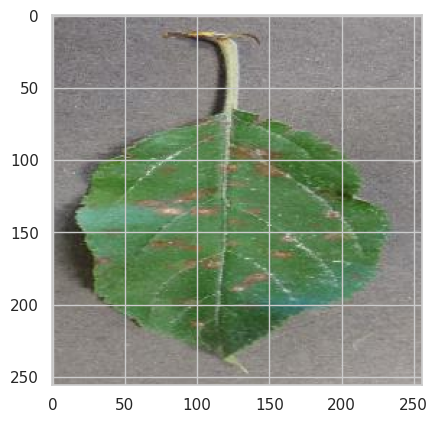

In [49]:
# predicting first image
img, label = test[1]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[1], ', Predicted:', predict_image(img, model))


Label: AppleScab2.JPG , Predicted: Apple___Apple_scab


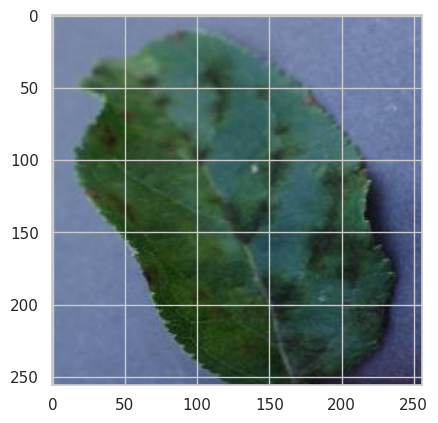

In [53]:
# predicting first image
img, label = test[5]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[5], ', Predicted:', predict_image(img, model))


Label: CornCommonRust3.JPG , Predicted: Corn_(maize)___Common_rust_


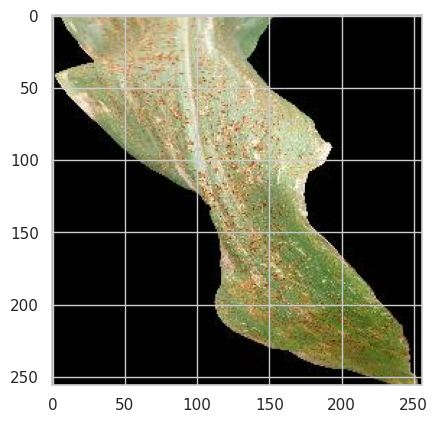

In [54]:
# predicting first image
img, label = test[9]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[9], ', Predicted:', predict_image(img, model))


Label: PotatoHealthy2.JPG , Predicted: Potato___healthy


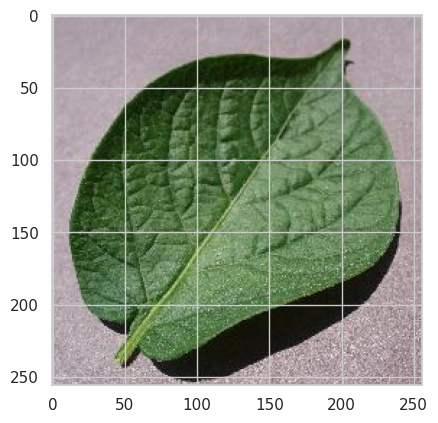

In [55]:
# predicting first image
img, label = test[16]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[16], ', Predicted:', predict_image(img, model))


Label: TomatoHealthy4.JPG , Predicted: Tomato___healthy


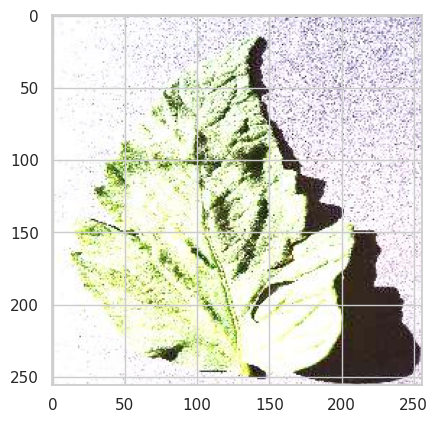

In [56]:
# predicting first image
img, label = test[26]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[26], ', Predicted:', predict_image(img, model))

In [57]:
# getting all predictions (actual label vs predicted)
for i, (img, label) in enumerate(test):
    print(Fore.GREEN)
    print('Label:', test_images[i], ', Predicted:', predict_image(img, model))


Label: AppleCedarRust1.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleCedarRust2.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleCedarRust3.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleCedarRust4.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleScab1.JPG , Predicted: Orange___Haunglongbing_(Citrus_greening)

Label: AppleScab2.JPG , Predicted: Apple___Apple_scab

Label: AppleScab3.JPG , Predicted: Apple___Apple_scab

Label: CornCommonRust1.JPG , Predicted: Corn_(maize)___Common_rust_

Label: CornCommonRust2.JPG , Predicted: Corn_(maize)___Common_rust_

Label: CornCommonRust3.JPG , Predicted: Corn_(maize)___Common_rust_

Label: PotatoEarlyBlight1.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight2.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight3.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight4.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight5.JPG , Predicted: Potato___Early_blight

Label: Pota